In [1]:
import os
import sys
from glob import glob
from PIL import Image
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from collections import defaultdict
from utils import label_map_util
from utils import visualization_utils as vis_util
import random

%matplotlib inline

In [2]:
def load_graph(graph_file):
    """Loads a frozen inference graph"""
    graph = tf.Graph()
    with graph.as_default():
        od_graph_def = tf.GraphDef()
        with tf.gfile.GFile(graph_file, 'rb') as fid:
            serialized_graph = fid.read()
            od_graph_def.ParseFromString(serialized_graph)
            tf.import_graph_def(od_graph_def, name='')
    return graph


def load_image_into_numpy_array(image):
    (im_width, im_height) = image.size
    return np.array(image.getdata()).reshape((im_height, im_width, 3)).astype(np.uint8)

In [3]:
## Test model
PATH_TO_GRAPH = r'models\saved\ssd_inception_v2_coco_11_06_2017_20000\frozen_inference_graph.pb'
PATH_TO_LABELS = r'data\label_map.pbtxt'
NUM_CLASSES = 4

In [4]:
detection_graph = load_graph(PATH_TO_GRAPH)

In [5]:
label_map = label_map_util.load_labelmap(PATH_TO_LABELS)
categories = label_map_util.convert_label_map_to_categories(label_map, max_num_classes=NUM_CLASSES, use_display_name=True)
category_index = label_map_util.create_category_index(categories)
print(category_index)

{1: {'name': 'Green', 'id': 1}, 2: {'name': 'Red', 'id': 2}, 3: {'name': 'Yellow', 'id': 3}, 4: {'name': 'Unknown', 'id': 4}}


In [6]:
IMAGE_SIZE = (12, 8)

SCORES
[  9.95811224e-01   7.21513154e-03   8.66318995e-04   8.62812041e-04
   7.29872496e-04   6.68720168e-04   6.67457585e-04   6.66819222e-04
   6.52834598e-04   6.33406686e-04]
CLASSES
[ 1.  1.  2.  1.  3.  1.  3.  1.  2.  1.]


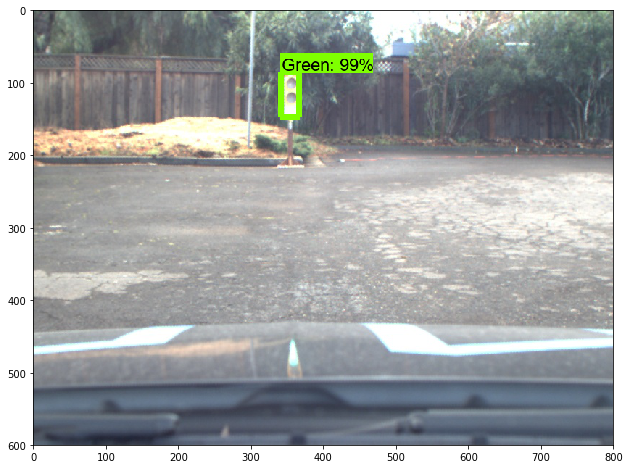

SCORES
[ 0.99499267  0.00210523  0.00204824  0.0020292   0.00157893  0.00153466
  0.00153333  0.00124351  0.0011491   0.00106865]
CLASSES
[ 3.  2.  2.  2.  3.  3.  3.  1.  1.  1.]


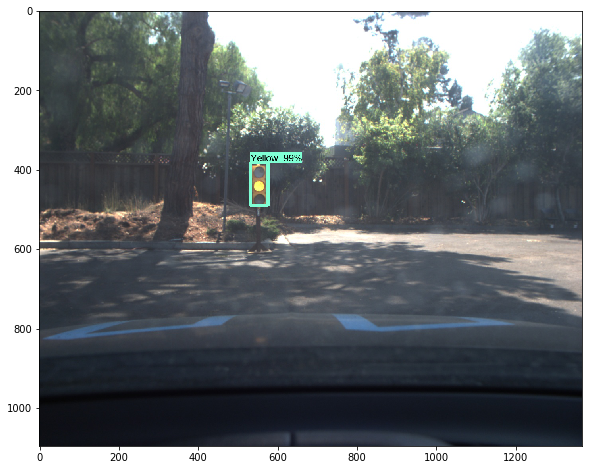

SCORES
[ 0.56712252  0.00470554  0.00293053  0.00288157  0.0025449   0.00243223
  0.00214773  0.00201696  0.00181209  0.00177435]
CLASSES
[ 2.  1.  2.  1.  1.  2.  2.  1.  1.  2.]


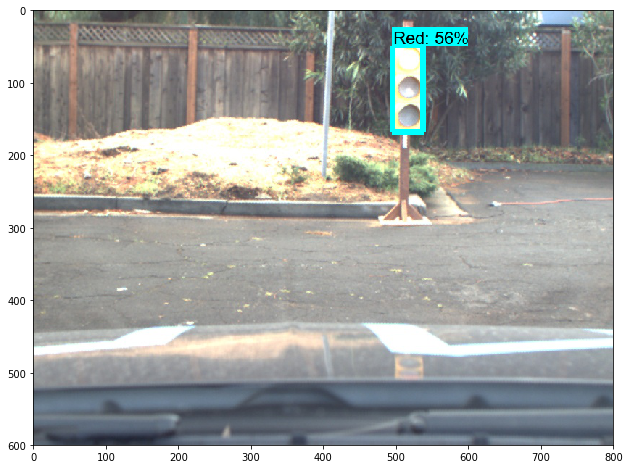

SCORES
[ 0.90122736  0.00505809  0.00466683  0.00408424  0.00385378  0.00329573
  0.00301654  0.00268334  0.002616    0.00257346]
CLASSES
[ 3.  3.  2.  2.  2.  2.  1.  1.  3.  2.]


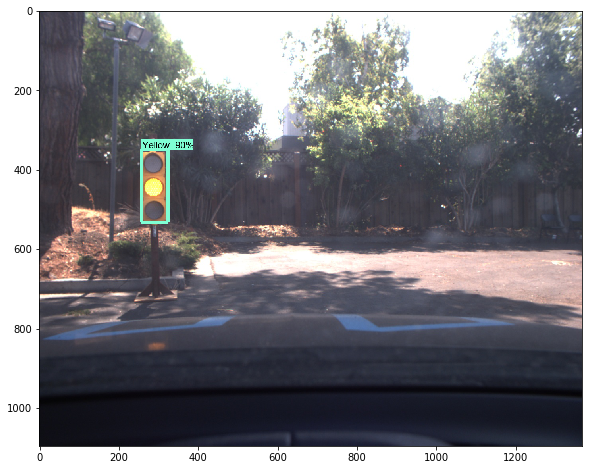

SCORES
[  9.87142444e-01   6.64900057e-03   4.49345866e-03   2.39287922e-03
   2.15405668e-03   1.40627124e-03   1.37536437e-03   1.30327349e-03
   8.47929972e-04   7.26163213e-04]
CLASSES
[ 1.  1.  1.  1.  3.  1.  1.  1.  3.  2.]


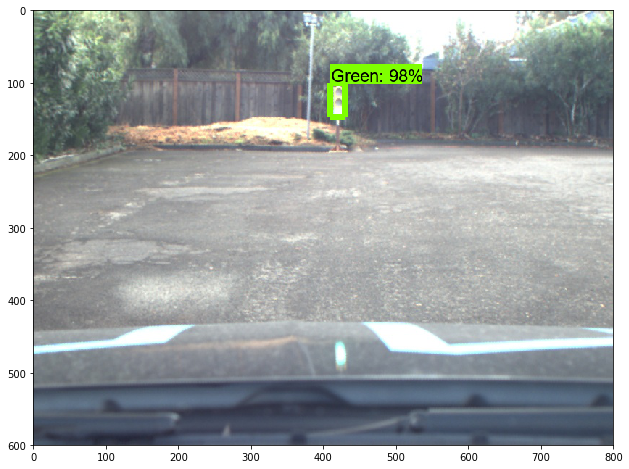

SCORES
[ 0.85987514  0.0103064   0.01002877  0.00999286  0.00618903  0.00546298
  0.00433425  0.00378093  0.00355422  0.00315066]
CLASSES
[ 2.  2.  2.  1.  3.  2.  1.  2.  3.  1.]


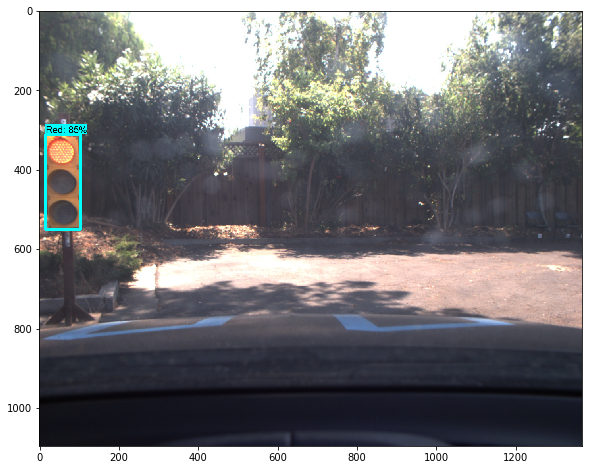

SCORES
[  9.70592976e-01   2.78669503e-03   2.72055948e-03   2.60200934e-03
   1.48755847e-03   1.20598928e-03   1.10850309e-03   9.65799147e-04
   8.16937303e-04   7.85067619e-04]
CLASSES
[ 2.  3.  2.  2.  2.  1.  2.  2.  2.  2.]


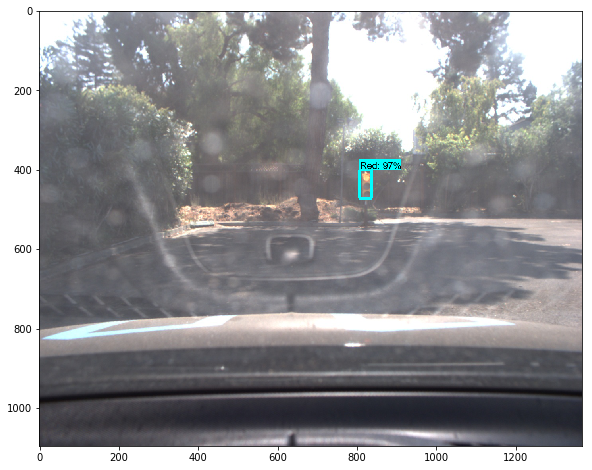

SCORES
[ 0.85987514  0.0103064   0.01002877  0.00999286  0.00618903  0.00546298
  0.00433425  0.00378093  0.00355422  0.00315066]
CLASSES
[ 2.  2.  2.  1.  3.  2.  1.  2.  3.  1.]


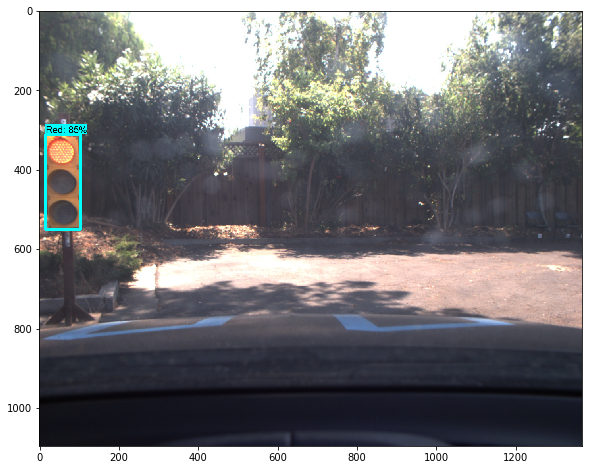

SCORES
[ 0.85987514  0.0103064   0.01002877  0.00999286  0.00618903  0.00546298
  0.00433425  0.00378093  0.00355422  0.00315066]
CLASSES
[ 2.  2.  2.  1.  3.  2.  1.  2.  3.  1.]


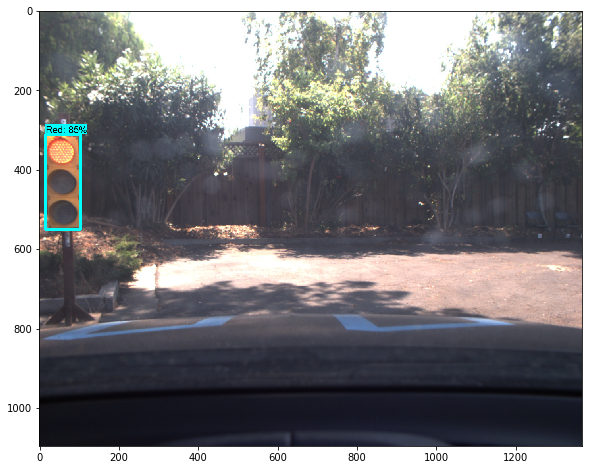

SCORES
[  9.24686611e-01   1.37351230e-02   1.45941053e-03   1.32016698e-03
   1.09638181e-03   1.07005564e-03   9.65446758e-04   9.62269027e-04
   8.83355562e-04   8.45394388e-04]
CLASSES
[ 2.  3.  2.  1.  1.  1.  1.  1.  3.  1.]


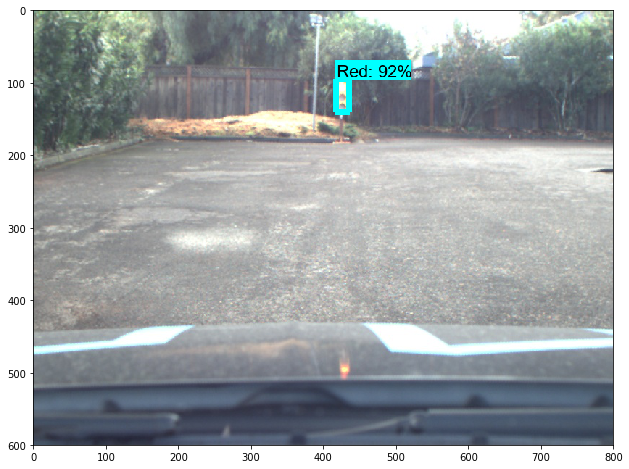

SCORES
[  9.63612914e-01   7.72338081e-03   2.95436103e-03   1.43924647e-03
   1.37799361e-03   1.19902170e-03   9.20605205e-04   9.02650063e-04
   7.95641972e-04   7.35325099e-04]
CLASSES
[ 1.  3.  1.  2.  1.  2.  1.  1.  2.  1.]


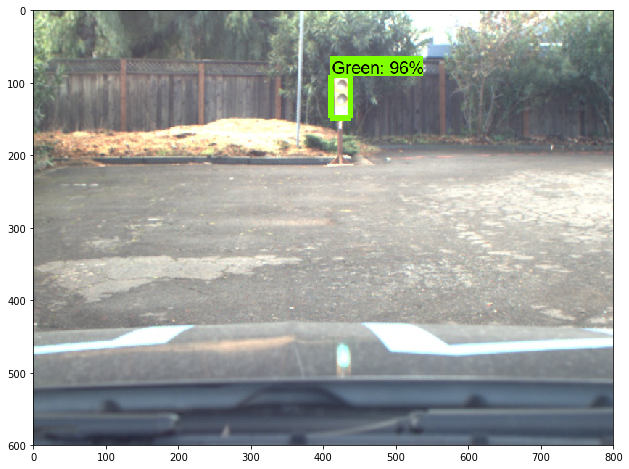

In [7]:
PATH_TO_IMGS = r'images'
TEST_IMGS = glob(os.path.join(PATH_TO_IMGS, r'*.jpg'))
random.shuffle(TEST_IMGS)

with detection_graph.as_default():
    gpu_options = tf.GPUOptions(allow_growth=True)  
    with tf.Session(config=tf.ConfigProto(gpu_options=gpu_options)) as sess:
        image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')
        detect_boxes = detection_graph.get_tensor_by_name('detection_boxes:0')
        detect_scores = detection_graph.get_tensor_by_name('detection_scores:0')
        detect_classes = detection_graph.get_tensor_by_name('detection_classes:0')
        num_detections = detection_graph.get_tensor_by_name('num_detections:0')
        
        for idx, img_path in enumerate(TEST_IMGS):
            random.shuffle(TEST_IMGS)
            image = Image.open(img_path)
            image_np = load_image_into_numpy_array(image)
            image_expanded = np.expand_dims(image_np, axis=0)
            
            (boxes, scores, classes, num) = sess.run(
                [detect_boxes, detect_scores, detect_classes, num_detections],
                feed_dict={image_tensor: image_expanded})
            
            print('SCORES')
            print(scores[0])
            print('CLASSES')
            print(classes[0])
            
            vis_util.visualize_boxes_and_labels_on_image_array(
                image_np, 
                np.squeeze(boxes),
                np.squeeze(classes).astype(np.int32),
                np.squeeze(scores),
                category_index,
                use_normalized_coordinates=True,
                max_boxes_to_draw=5,
                line_thickness=8)
            plt.figure(figsize=IMAGE_SIZE)
            plt.imshow(image_np)
            plt.show()
            
            if idx == 10:
                break

In [8]:
## Test model
PATH_TO_GRAPH = r'models\saved\ssd_mobilenet_v1_coco_11_06_2017_20000\frozen_inference_graph.pb'
PATH_TO_LABELS = r'data\label_map.pbtxt'
NUM_CLASSES = 4

In [9]:
detection_graph = load_graph(PATH_TO_GRAPH)

In [10]:
label_map = label_map_util.load_labelmap(PATH_TO_LABELS)
categories = label_map_util.convert_label_map_to_categories(label_map, max_num_classes=NUM_CLASSES, use_display_name=True)
category_index = label_map_util.create_category_index(categories)
print(category_index)

{1: {'name': 'Green', 'id': 1}, 2: {'name': 'Red', 'id': 2}, 3: {'name': 'Yellow', 'id': 3}, 4: {'name': 'Unknown', 'id': 4}}


In [11]:
IMAGE_SIZE = (12, 8)

SCORES
[ 0.84119755  0.03358063  0.00139144  0.0012341   0.00102062  0.00098334
  0.00094034  0.00091885  0.00088242  0.00085771]
CLASSES
[ 3.  2.  3.  3.  1.  2.  4.  1.  4.  2.]


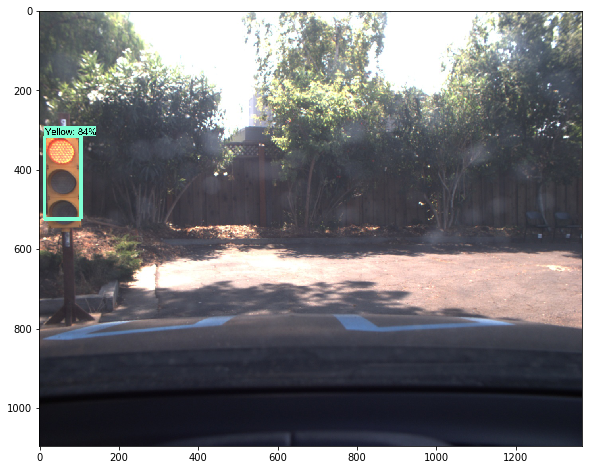

SCORES
[  9.02700484e-01   1.49205211e-03   1.35695538e-03   1.03729707e-03
   1.01613416e-03   8.93049873e-04   8.14314350e-04   7.16085953e-04
   7.01590499e-04   7.01123266e-04]
CLASSES
[ 1.  3.  3.  1.  3.  1.  4.  3.  1.  2.]


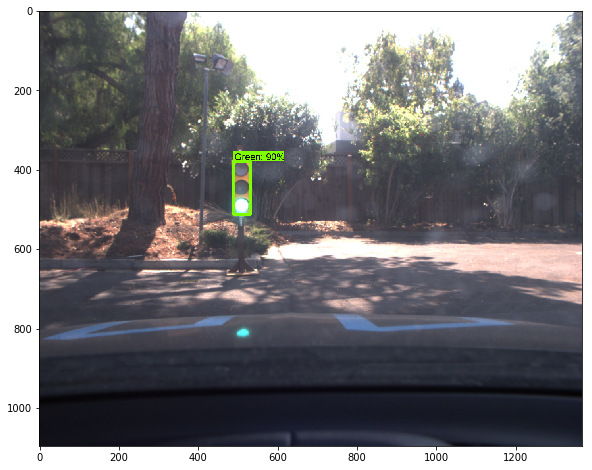

SCORES
[  9.99576390e-01   1.45279360e-03   4.52071021e-04   2.63533148e-04
   1.55894930e-04   1.53577770e-04   1.42182456e-04   1.40214732e-04
   1.35672453e-04   1.33179026e-04]
CLASSES
[ 1.  1.  1.  1.  2.  1.  1.  1.  3.  4.]


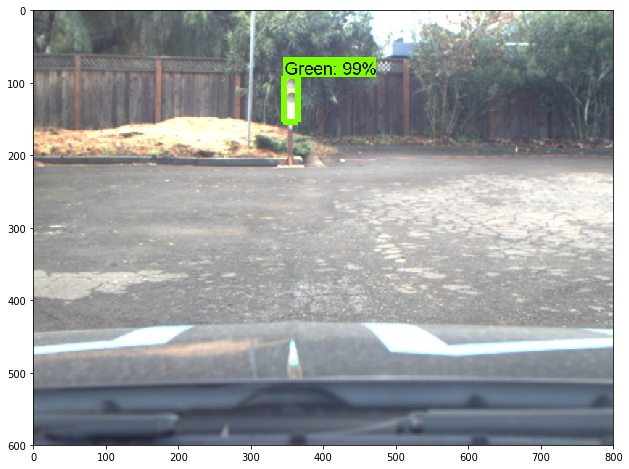

SCORES
[  9.76805806e-01   4.14127903e-03   2.73620407e-03   7.10244814e-04
   5.05271310e-04   4.11495072e-04   3.07628099e-04   3.06297967e-04
   2.46134266e-04   2.43901683e-04]
CLASSES
[ 3.  2.  1.  1.  1.  3.  1.  4.  2.  4.]


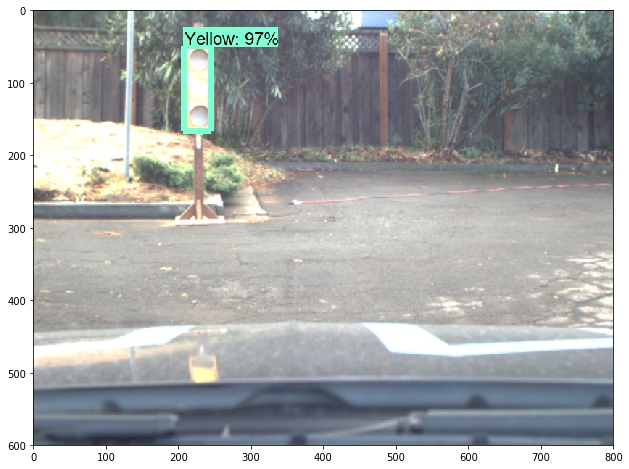

SCORES
[  9.75411594e-01   3.30186170e-03   5.37392101e-04   3.63054394e-04
   3.55284486e-04   1.96691151e-04   1.54601279e-04   1.54387075e-04
   1.52073044e-04   1.51504675e-04]
CLASSES
[ 1.  1.  2.  1.  1.  1.  1.  2.  1.  1.]


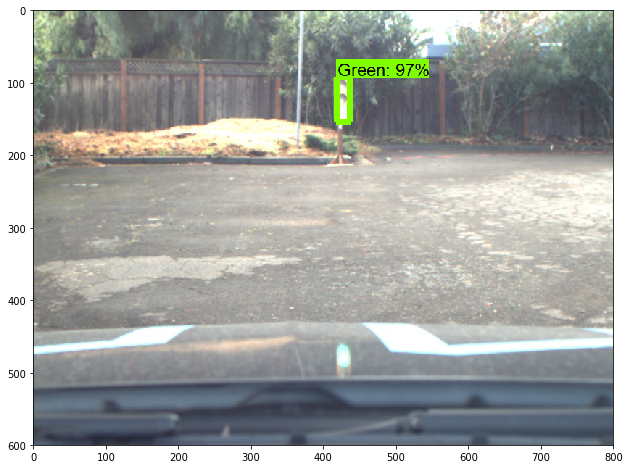

SCORES
[  9.95677412e-01   5.69334312e-04   5.55927225e-04   3.93761729e-04
   3.07499926e-04   2.97754857e-04   2.08674261e-04   1.88925304e-04
   1.65960111e-04   1.60330412e-04]
CLASSES
[ 2.  1.  1.  1.  1.  2.  2.  1.  1.  1.]


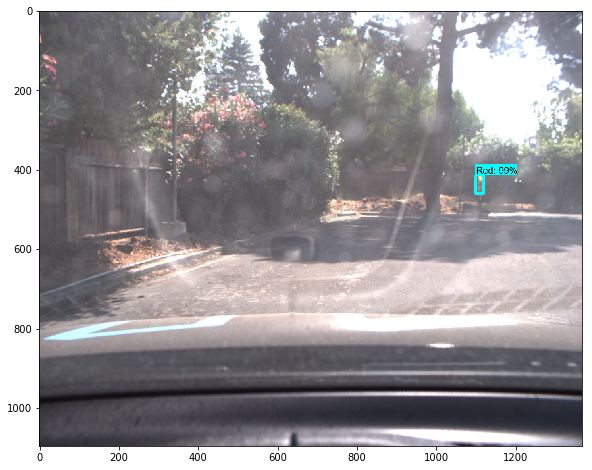

SCORES
[  9.87219810e-01   5.67627838e-04   4.98457463e-04   4.52922483e-04
   4.47341619e-04   3.51562077e-04   3.48858593e-04   3.19454120e-04
   3.00412619e-04   2.90257420e-04]
CLASSES
[ 1.  1.  1.  2.  3.  1.  1.  4.  3.  1.]


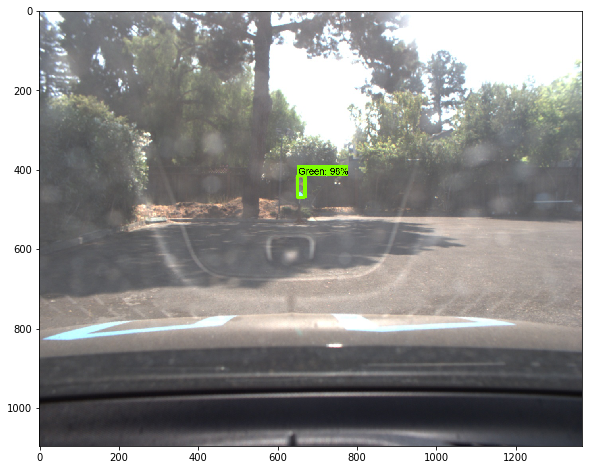

SCORES
[  9.99273956e-01   3.53667798e-04   3.28227034e-04   2.14769563e-04
   2.02198833e-04   1.93359869e-04   1.76193571e-04   1.64669764e-04
   1.63551391e-04   1.56657567e-04]
CLASSES
[ 1.  3.  2.  1.  1.  4.  2.  1.  1.  1.]


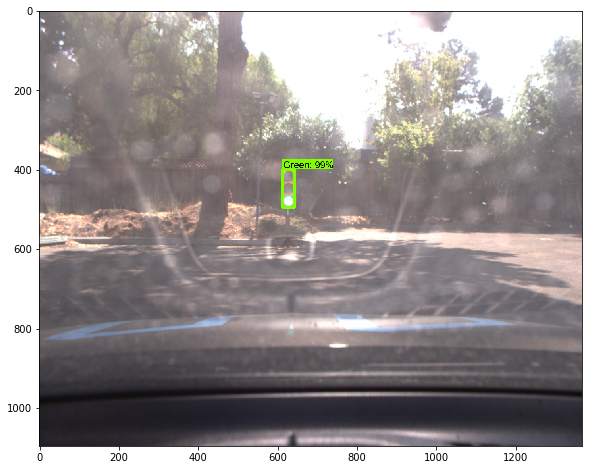

SCORES
[  9.78524983e-01   5.49912192e-02   3.53033101e-04   2.28095712e-04
   2.05162563e-04   2.00122973e-04   1.88334830e-04   1.78485425e-04
   1.73641136e-04   1.65217862e-04]
CLASSES
[ 1.  1.  1.  1.  1.  1.  1.  1.  3.  2.]


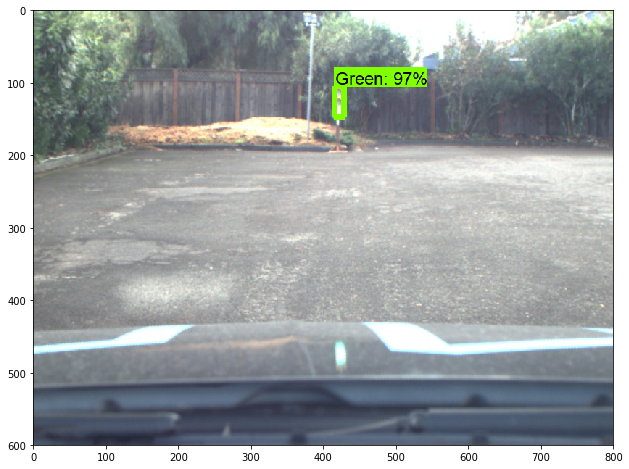

SCORES
[  9.98789012e-01   9.23583109e-04   7.65720557e-04   4.98679932e-04
   4.83004842e-04   3.98304779e-04   3.60710721e-04   2.91493430e-04
   2.83339614e-04   2.81574379e-04]
CLASSES
[ 2.  3.  3.  3.  4.  1.  2.  1.  3.  2.]


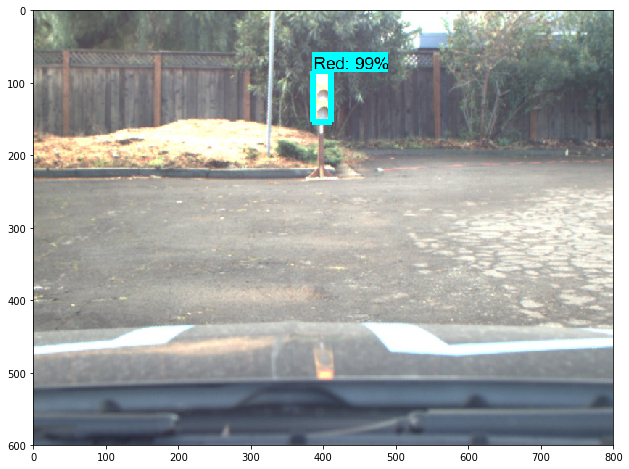

SCORES
[  9.96450782e-01   3.71906441e-04   2.64669245e-04   2.25800730e-04
   2.05340431e-04   2.01668387e-04   1.87123034e-04   1.62080105e-04
   1.55237940e-04   1.51481712e-04]
CLASSES
[ 2.  1.  1.  2.  1.  2.  3.  1.  2.  1.]


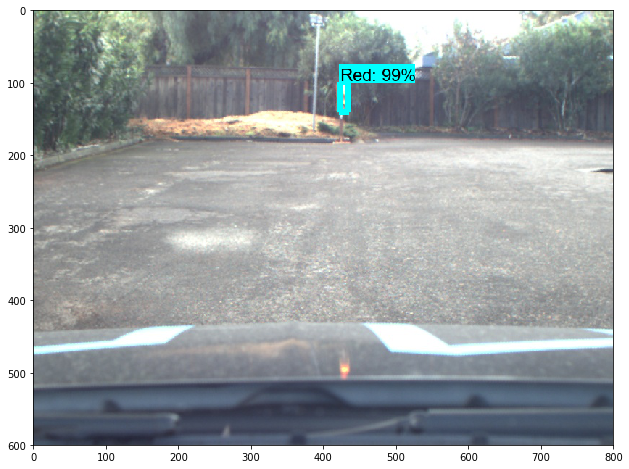

In [12]:
PATH_TO_IMGS = r'images'
TEST_IMGS = glob(os.path.join(PATH_TO_IMGS, r'*.jpg'))
random.shuffle(TEST_IMGS)

with detection_graph.as_default():
    gpu_options = tf.GPUOptions(allow_growth=True)  
    with tf.Session(config=tf.ConfigProto(gpu_options=gpu_options)) as sess:
        image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')
        detect_boxes = detection_graph.get_tensor_by_name('detection_boxes:0')
        detect_scores = detection_graph.get_tensor_by_name('detection_scores:0')
        detect_classes = detection_graph.get_tensor_by_name('detection_classes:0')
        num_detections = detection_graph.get_tensor_by_name('num_detections:0')
        
        for idx, img_path in enumerate(TEST_IMGS):
            random.shuffle(TEST_IMGS)
            image = Image.open(img_path)
            image_np = load_image_into_numpy_array(image)
            image_expanded = np.expand_dims(image_np, axis=0)
            
            (boxes, scores, classes, num) = sess.run(
                [detect_boxes, detect_scores, detect_classes, num_detections],
                feed_dict={image_tensor: image_expanded})
            
            print('SCORES')
            print(scores[0])
            print('CLASSES')
            print(classes[0])
            
            vis_util.visualize_boxes_and_labels_on_image_array(
                image_np, 
                np.squeeze(boxes),
                np.squeeze(classes).astype(np.int32),
                np.squeeze(scores),
                category_index,
                use_normalized_coordinates=True,
                max_boxes_to_draw=5,
                line_thickness=8)
            plt.figure(figsize=IMAGE_SIZE)
            plt.imshow(image_np)
            plt.show()
            
            if idx == 10:
                break